# Photometric Stereo 

## import libraries

In [ ]:
import os
import gdown
import zipfile
import numpy as np
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

## load data


This notebook fetches the datafile `PhotometricStereo_CatDataset.zip`. To get started, simply Run All.

The contents of this dataset are:
```
TopDirectory
+-- README.txt                # Important to read this! Describes the coordinate system
+-- capture_config.jpg        # Example of configuration used for data capture
+-- Object                   
|   |-- Image_NN.png          # Object images, numbered
|
+-- LightProbe-{1,2}          
|   |-- Image_NN.JPG          # Light probe images, numbered
|   |-- ref.JPG               # Reference light probe image with ambient lighting
|   |-- circle_data.txt       # (xc,yc,r) circle center and radius of light probe's image
|   |-- light_directions.txt  # Estimated lighting directions from one light probe
|
+-- light_directions.txt      # Final lighting directions from both light probes.
```

---

In [2]:
#@title Fetch data from Google drive and unzip

file_id = '1F3HAUmpNnSyAKgfmifoT91UfSK_HRXb1'
output_filename = 'PhotometricStereo_CatDataset.zip'

!gdown --id {file_id} -O {output_filename}
print(f"Downloaded {output_filename}")

zip_file_path = 'PhotometricStereo_CatDataset.zip'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall('.')

print(f"Successfully extracted {zip_file_path} to the current directory.")

/Users/maiaposternack/Desktop/cs/es-143_final_project-/.venv/lib/python3.13/site-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1F3HAUmpNnSyAKgfmifoT91UfSK_HRXb1
To: /Users/maiaposternack/Desktop/cs/es-143_final_project-/PhotometricStereo_CatDataset.zip
100%|██████████████████████████████████████| 3.99M/3.99M [00:00<00:00, 16.1MB/s]
Downloaded PhotometricStereo_CatDataset.zip
Successfully extracted PhotometricStereo_CatDataset.zip to the current directory.


In [3]:
#@title Set base filepath
base_data_filepath = './PhotometricStereo_CatDataset'

In [4]:
#@title Load light source vectors
print('Loading data...')

# Load lighting directions
L = np.loadtxt(os.path.join(base_data_filepath, 'light_directions.txt'))
L=L.T

print('Lighting directions loaded successfully.')
print('Shape of L:', L.shape)

print('Light directions:')
print(L)

Loading data...
Lighting directions loaded successfully.
Shape of L: (20, 3)
Light directions:
[[-0.28522352  0.54462539  0.78868925]
 [-0.27903418  0.39904162  0.87344474]
 [-0.2628258   0.09546155  0.96010921]
 [-0.35967582 -0.09404883  0.92832544]
 [-0.34379312 -0.19814872  0.91790161]
 [-0.16758774  0.41599877  0.89378934]
 [-0.15635927  0.23670483  0.95891741]
 [-0.1564817  -0.04804361  0.98651168]
 [-0.12491056 -0.2917688   0.94829759]
 [-0.11063099 -0.40220894  0.90883923]
 [ 0.19141672  0.41377018  0.89003027]
 [ 0.19997346  0.245478    0.94855214]
 [ 0.21276869 -0.01192947  0.97702977]
 [ 0.20496467 -0.28528361  0.93627066]
 [ 0.19171595 -0.40085253  0.89585838]
 [ 0.35085791  0.59170881  0.72579571]
 [ 0.39517094  0.4675701   0.79070736]
 [ 0.44640483  0.25791918  0.85685496]
 [ 0.40976937  0.08676142  0.9080537 ]
 [ 0.42696482 -0.02660515  0.90387677]]


---
## Photometric Stereo Implementation

Now we'll implement the photometric stereo pipeline to recover surface normals, albedo, and depth from the images.

### Mathematical Foundation: Image Formation Model

For a Lambertian surface under directional lighting, the observed intensity at pixel $x$ is:

$$I(x) = \rho(x) \cdot \mathbf{n}(x)^T \mathbf{l}$$

where:
- $I(x)$ = observed intensity at pixel $x$
- $\rho(x)$ = albedo (reflectance) at pixel $x$, where $\rho \in [0, 1]$
- $\mathbf{n}(x)$ = unit surface normal at pixel $x$, where $\|\mathbf{n}\| = 1$
- $\mathbf{l}$ = light direction vector (unit length)

The dot product $\mathbf{n}^T \mathbf{l} = \cos\theta$ represents Lambert's cosine law, where $\theta$ is the angle between the surface normal and light direction.

Loaded 20 images with shape: (20, 640, 500, 3)

DEBUG: Image Loading Verification
Number of images: 20
Image dimensions: 640 x 500
Color channels: 3

Intensity statistics across all images:
  Min: 0.00
  Max: 255.00
  Mean: 74.48
  Std: 75.38

Consistency check (variance across images):
  Average pixel variance: 922.55
  (High variance = good, indicates lighting changes)


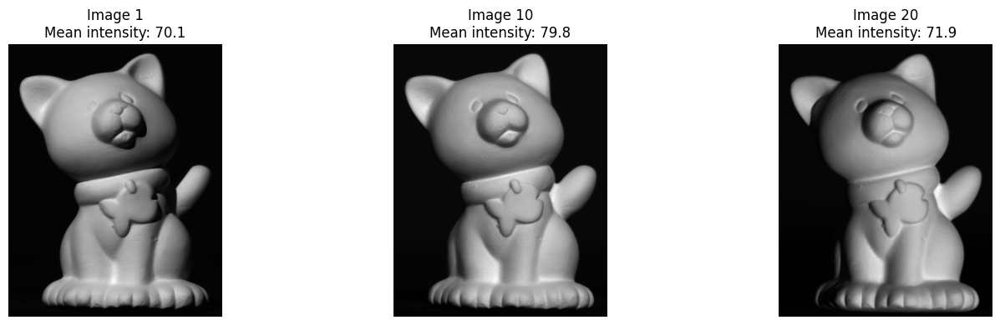

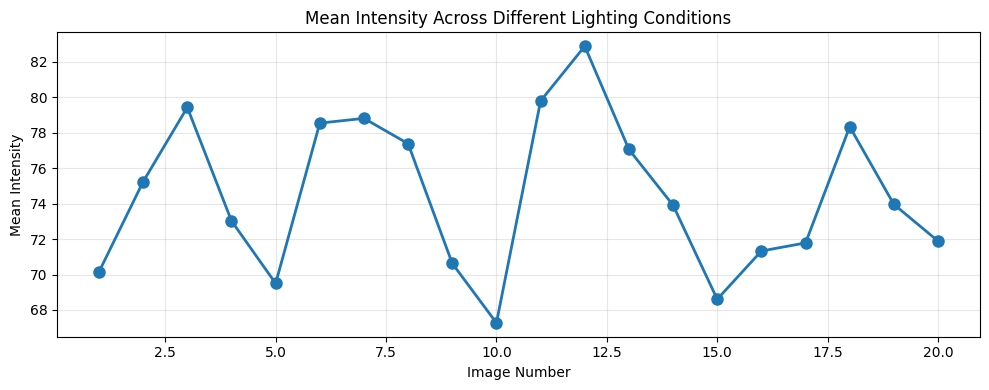

In [5]:
#@title Load all object images

def load_images(image_folder, num_images=20):
    """
    Load all captured images of an object taken under different lighting conditions.
    
    Args:
        image_folder (str): Path to folder containing images
        num_images (int): Number of images to load
        
    Returns:
        images: NumPy array of shape (num_images, H, W, 3) in RGB format
    """
    images = []
    
    for i in range(1, num_images + 1):
        img_path = os.path.join(image_folder, f'Image_{i:02d}.png')
        img = cv2.imread(img_path)
        if img is None:
            raise ValueError(f"Could not load image: {img_path}")
        # Convert BGR to RGB
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img_rgb)
    
    images = np.array(images)
    print(f"Loaded {len(images)} images with shape: {images.shape}")
    
    return images

def debug_image_loading(images):
    """
    Debug function: Verify image loading and check for consistency.
    """
    print("\n" + "="*60)
    print("DEBUG: Image Loading Verification")
    print("="*60)
    
    # Check dimensions
    print(f"Number of images: {images.shape[0]}")
    print(f"Image dimensions: {images.shape[1]} x {images.shape[2]}")
    print(f"Color channels: {images.shape[3]}")
    
    # Check intensity statistics
    print(f"\nIntensity statistics across all images:")
    print(f"  Min: {images.min():.2f}")
    print(f"  Max: {images.max():.2f}")
    print(f"  Mean: {images.mean():.2f}")
    print(f"  Std: {images.std():.2f}")
    
    # Check for consistency (camera should be fixed)
    print(f"\nConsistency check (variance across images):")
    variance_map = np.var(images, axis=0).mean()
    print(f"  Average pixel variance: {variance_map:.2f}")
    print(f"  (High variance = good, indicates lighting changes)")
    
    # Visualize intensity distribution
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    
    # First, middle, and last images
    axes[0].imshow(images[0])
    axes[0].set_title(f'Image 1\nMean intensity: {images[0].mean():.1f}')
    axes[0].axis('off')
    
    axes[1].imshow(images[len(images)//2])
    axes[1].set_title(f'Image {len(images)//2}\nMean intensity: {images[len(images)//2].mean():.1f}')
    axes[1].axis('off')
    
    axes[2].imshow(images[-1])
    axes[2].set_title(f'Image {len(images)}\nMean intensity: {images[-1].mean():.1f}')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Plot mean intensity per image
    mean_intensities = [img.mean() for img in images]
    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(images)+1), mean_intensities, 'o-', linewidth=2, markersize=8)
    plt.xlabel('Image Number')
    plt.ylabel('Mean Intensity')
    plt.title('Mean Intensity Across Different Lighting Conditions')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    print("="*60 + "\n")

# Load all object images
object_folder = os.path.join(base_data_filepath, 'Object')
images = load_images(object_folder, num_images=20)

# Debug image loading
debug_image_loading(images)

### Step 1: Object Segmentation

Before applying photometric stereo, we need to isolate the object from the background. We create a binary mask $M(x) \in \{0, 1\}$ where:

$$M(x) = \begin{cases} 
1 & \text{if } \bar{I}(x) > \tau \\
0 & \text{otherwise}
\end{cases}$$

where:
- $\bar{I}(x) = \frac{1}{n}\sum_{i=1}^{n} I_i(x)$ is the mean intensity across all images
- $\tau$ is an intensity threshold

We apply morphological operations (closing and opening) to remove noise and fill holes.


DEBUG: Mask Creation Process
Mean intensity statistics:
  Min: 0.90
  Max: 227.45
  Mean: 74.48
  Threshold: 10

Mask statistics:
  Raw mask pixels: 180687 / 320000 (56.5%)
  Final mask pixels: 180700 / 320000 (56.5%)
  Pixels removed by morphology: 18446744073709551603


/var/folders/zg/262jrm6s5fv9b44v90yj96lh0000gn/T/ipykernel_65470/3207917782.py:51: RuntimeWarning: overflow encountered in scalar subtract
  print(f"  Pixels removed by morphology: {np.sum(raw_mask) - np.sum(mask)}")


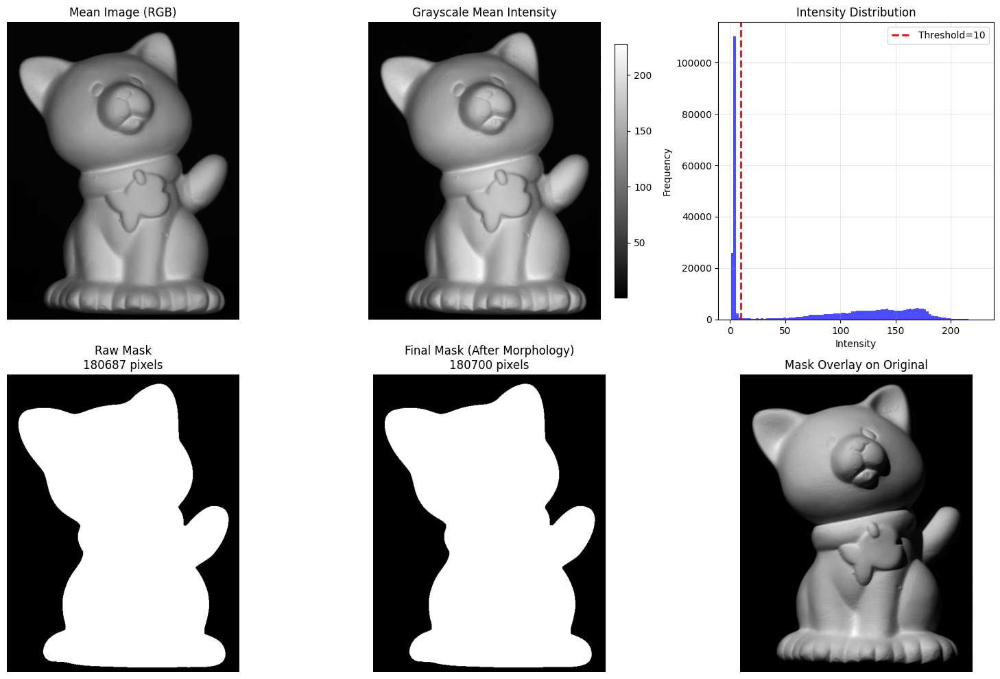

In [6]:
#@title Create object mask

def create_mask(images, threshold=10):
    """
    Create a binary mask to isolate the object region.
    
    Args:
        images: Array of images (num_images, H, W, 3)
        threshold: Intensity threshold to separate object from background
        
    Returns:
        mask: Binary mask (H, W) where 1 = object, 0 = background
    """
    # Use the mean intensity across all images
    mean_image = np.mean(images, axis=0)
    gray_mean = np.mean(mean_image, axis=2)
    
    # Create mask where intensity is above threshold
    mask = (gray_mean > threshold).astype(np.uint8)
    
    # Apply morphological operations to clean up the mask
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    
    return mask

def debug_mask_creation(images, mask, threshold=10):
    """
    Debug function: Visualize mask creation process step by step.
    """
    print("\n" + "="*60)
    print("DEBUG: Mask Creation Process")
    print("="*60)
    
    # Compute intermediate steps
    mean_image = np.mean(images, axis=0)
    gray_mean = np.mean(mean_image, axis=2)
    raw_mask = (gray_mean > threshold).astype(np.uint8)
    
    # Statistics
    print(f"Mean intensity statistics:")
    print(f"  Min: {gray_mean.min():.2f}")
    print(f"  Max: {gray_mean.max():.2f}")
    print(f"  Mean: {gray_mean.mean():.2f}")
    print(f"  Threshold: {threshold}")
    
    print(f"\nMask statistics:")
    print(f"  Raw mask pixels: {np.sum(raw_mask)} / {raw_mask.size} ({100*np.sum(raw_mask)/raw_mask.size:.1f}%)")
    print(f"  Final mask pixels: {np.sum(mask)} / {mask.size} ({100*np.sum(mask)/mask.size:.1f}%)")
    print(f"  Pixels removed by morphology: {np.sum(raw_mask) - np.sum(mask)}")
    
    # Visualize mask creation steps
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Mean image
    axes[0, 0].imshow(mean_image.astype(np.uint8))
    axes[0, 0].set_title('Mean Image (RGB)')
    axes[0, 0].axis('off')
    
    # Grayscale mean
    im1 = axes[0, 1].imshow(gray_mean, cmap='gray')
    axes[0, 1].set_title('Grayscale Mean Intensity')
    axes[0, 1].axis('off')
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046)
    
    # Histogram with threshold
    axes[0, 2].hist(gray_mean.flatten(), bins=100, color='blue', alpha=0.7)
    axes[0, 2].axvline(threshold, color='red', linestyle='--', linewidth=2, label=f'Threshold={threshold}')
    axes[0, 2].set_xlabel('Intensity')
    axes[0, 2].set_ylabel('Frequency')
    axes[0, 2].set_title('Intensity Distribution')
    axes[0, 2].legend()
    axes[0, 2].grid(True, alpha=0.3)
    
    # Raw mask (before morphology)
    axes[1, 0].imshow(raw_mask, cmap='gray')
    axes[1, 0].set_title(f'Raw Mask\n{np.sum(raw_mask)} pixels')
    axes[1, 0].axis('off')
    
    # Final mask (after morphology)
    axes[1, 1].imshow(mask, cmap='gray')
    axes[1, 1].set_title(f'Final Mask (After Morphology)\n{np.sum(mask)} pixels')
    axes[1, 1].axis('off')
    
    # Mask overlay on image
    overlay = images[0].copy().astype(float)
    overlay[mask == 0] = overlay[mask == 0] * 0.3  # Darken background
    axes[1, 2].imshow(overlay.astype(np.uint8))
    axes[1, 2].set_title('Mask Overlay on Original')
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print("="*60 + "\n")

# Create mask
mask = create_mask(images)

# Debug mask creation
debug_mask_creation(images, mask)

### Step 2: Photometric Stereo - The Core Equation

Given $n$ images of the same object under different lighting directions, we can write for each pixel:

$$\begin{bmatrix} I_1 \\ I_2 \\ \vdots \\ I_n \end{bmatrix} = \begin{bmatrix} \mathbf{l}_1^T \\ \mathbf{l}_2^T \\ \vdots \\ \mathbf{l}_n^T \end{bmatrix} \begin{bmatrix} \rho n_x \\ \rho n_y \\ \rho n_z \end{bmatrix} = \mathbf{L} \mathbf{b}$$

where:
- $\mathbf{I} \in \mathbb{R}^{n \times 1}$ is the vector of observed intensities
- $\mathbf{L} \in \mathbb{R}^{n \times 3}$ is the matrix of light directions (each row is a unit vector)
- $\mathbf{b} = \rho \mathbf{n} \in \mathbb{R}^{3 \times 1}$ is the **pseudo-normal** (albedo × normal)

**Least Squares Solution:**

$$\mathbf{b} = (\mathbf{L}^T \mathbf{L})^{-1} \mathbf{L}^T \mathbf{I}$$

**Extracting Albedo and Normal:**

$$\rho = \|\mathbf{b}\| = \sqrt{b_x^2 + b_y^2 + b_z^2}$$

$$\mathbf{n} = \frac{\mathbf{b}}{\|\mathbf{b}\|} = \frac{\mathbf{b}}{\rho}$$

This requires $n \geq 3$ images (overdetermined system is better for noise robustness).

In [7]:
#@title Load light directions

def load_light_directions(filepath):
    """
    Load light direction vectors from file.
    
    Args:
        filepath: Path to light_directions.txt file
        
    Returns:
        L: Light direction matrix (num_lights, 3) where each row is a unit vector
    """
    # Load the data - it's stored as 3 rows (x, y, z components) with each column being a light
    data = np.loadtxt(filepath)
    
    # Transpose to get (num_lights, 3) format
    L = data.T
    
    print(f"Loaded {L.shape[0]} light directions")
    print(f"Light direction matrix shape: {L.shape}")
    
    # Verify they are unit vectors
    norms = np.linalg.norm(L, axis=1)
    print(f"Light direction norms - Min: {norms.min():.4f}, Max: {norms.max():.4f}, Mean: {norms.mean():.4f}")
    
    return L

# Load light directions
light_directions_file = os.path.join(base_data_filepath, 'light_directions.txt')
L = load_light_directions(light_directions_file)

Loaded 20 light directions
Light direction matrix shape: (20, 3)
Light direction norms - Min: 1.0000, Max: 1.0000, Mean: 1.0000


Estimating surface normals (with shadow handling)...
Normal map shape: (640, 500, 3)
Albedo map shape: (640, 500)
Estimating surface normals and albedo...
Normal map shape: (640, 500, 3)
Albedo map shape: (640, 500)

DEBUG: Photometric Stereo Solution
Light direction matrix L:
  Shape: (20, 3)
  Condition number: 3.36
  (Lower is better; <100 is good)

Light direction norms (should be ~1.0):
  Min: 1.0000
  Max: 1.0000
  Mean: 1.0000

Normal vector norms (should be ~1.0):
  Min: 1.0000
  Max: 1.0000
  Mean: 1.0000
  Std: 0.0000

Albedo statistics:
  Min: 8.82
  Max: 440.70
  Mean: 197.69
  Std: 29.72

Reconstruction error check:
  Mean absolute error per image:
    Min: 2.50
    Max: 8.03
    Mean: 4.85
  (Lower is better; <10 is good)


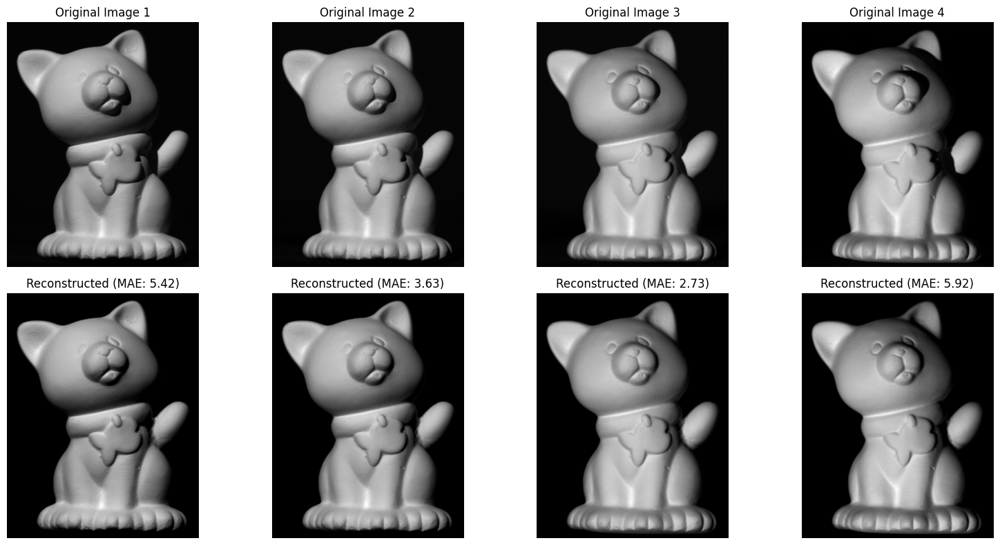

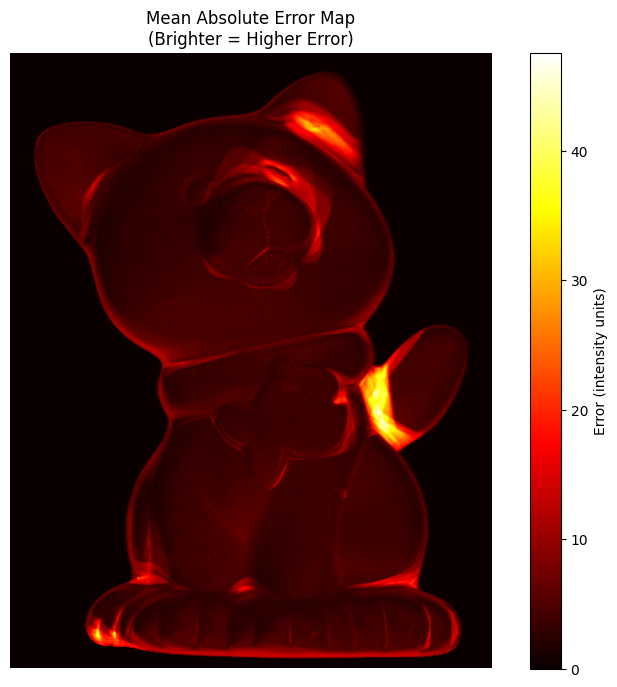

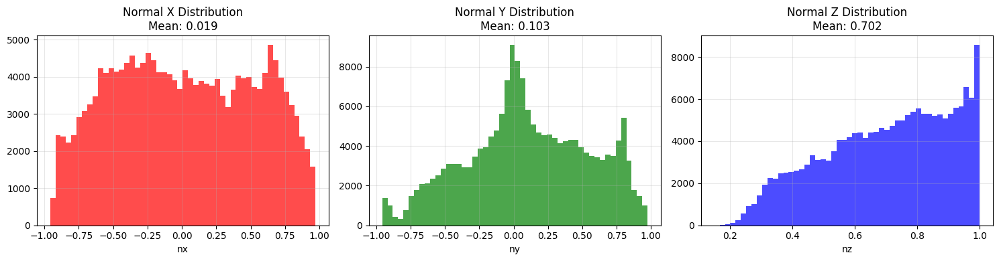

In [9]:
#@title Estimate surface normals with shadow handling

def estimate_surface_normals(images, light_directions, mask, shadow_threshold=0.2):
    """
    Estimate surface normals and albedo using photometric stereo with shadow handling.
    
    For each pixel, discards the darkest observations (likely shadows) before
    solving the least squares problem.
    
    Args:
        images: RGB images (num_images, H, W, 3)
        light_directions: Light direction vectors (num_images, 3)
        mask: Binary mask (H, W)
        shadow_threshold: Fraction of darkest observations to discard (0.0-0.5)
        
    Returns:
        normal_map: Unit surface normals (H, W, 3)
        albedo_map: Albedo values (H, W)
    """
    num_images, H, W, C = images.shape
    n_lights = light_directions.shape[0]
    
    # Convert images to grayscale for photometric stereo
    gray_images = np.mean(images, axis=3)  # (num_images, H, W)
    
    # Initialize outputs
    normal_map = np.zeros((H, W, 3))
    albedo_map = np.zeros((H, W))
    
    L = light_directions
    
    # Process each pixel
    for i in range(H):
        for j in range(W):
            if mask[i, j] == 0:
                continue
            
            # Get intensity observations for this pixel
            I_pixel = gray_images[:, i, j]  # (n_lights,)
            
            # Identify and remove shadows (lowest intensities)
            n_discard = int(n_lights * shadow_threshold)
            if n_discard > 0:
                # Get indices of brightest observations
                bright_indices = np.argsort(I_pixel)[n_discard:]
                
                # Use only bright observations
                I_bright = I_pixel[bright_indices]
                L_bright = L[bright_indices]
            else:
                I_bright = I_pixel
                L_bright = L
            
            # Solve least squares: I = L * b
            # where b = albedo * normal (pseudo-normal)
            if len(I_bright) >= 3:  # Need at least 3 observations
                try:
                    LtL_inv = np.linalg.inv(L_bright.T @ L_bright)
                    b = LtL_inv @ L_bright.T @ I_bright
                    
                    # Extract albedo and normal
                    albedo = np.linalg.norm(b)
                    if albedo > 1e-6:
                        normal = b / albedo
                        normal_map[i, j] = normal
                        albedo_map[i, j] = albedo
                except np.linalg.LinAlgError:
                    # Singular matrix, skip this pixel
                    pass
    
    # Apply mask
    albedo_map = albedo_map * mask
    normal_map = normal_map * mask[:, :, np.newaxis]
    
    return normal_map, albedo_map


# Use the robust version
print("Estimating surface normals (with shadow handling)...")
normal_map, albedo_map = estimate_surface_normals(
    images, L, mask, 
    shadow_threshold=0.2  # Discard darkest 20%
)

print(f"Normal map shape: {normal_map.shape}")
print(f"Albedo map shape: {albedo_map.shape}")

def debug_photometric_stereo(images, L, normal_map, albedo_map, mask):
    """
    Debug function: Verify photometric stereo solution mathematically and visually.
    """
    print("\n" + "="*60)
    print("DEBUG: Photometric Stereo Solution")
    print("="*60)
    
    # Check light direction matrix
    print(f"Light direction matrix L:")
    print(f"  Shape: {L.shape}")
    print(f"  Condition number: {np.linalg.cond(L):.2f}")
    print(f"  (Lower is better; <100 is good)")
    
    # Check if light directions are unit vectors
    light_norms = np.linalg.norm(L, axis=1)
    print(f"\nLight direction norms (should be ~1.0):")
    print(f"  Min: {light_norms.min():.4f}")
    print(f"  Max: {light_norms.max():.4f}")
    print(f"  Mean: {light_norms.mean():.4f}")
    
    # Check normal map
    normal_norms = np.linalg.norm(normal_map, axis=2)
    normal_norms_masked = normal_norms[mask > 0]
    print(f"\nNormal vector norms (should be ~1.0):")
    print(f"  Min: {normal_norms_masked.min():.4f}")
    print(f"  Max: {normal_norms_masked.max():.4f}")
    print(f"  Mean: {normal_norms_masked.mean():.4f}")
    print(f"  Std: {normal_norms_masked.std():.4f}")
    
    # Check albedo
    albedo_masked = albedo_map[mask > 0]
    print(f"\nAlbedo statistics:")
    print(f"  Min: {albedo_masked.min():.2f}")
    print(f"  Max: {albedo_masked.max():.2f}")
    print(f"  Mean: {albedo_masked.mean():.2f}")
    print(f"  Std: {albedo_masked.std():.2f}")
    
    # Reconstruction error: Verify I = L * b
    print(f"\nReconstruction error check:")
    gray_images = np.mean(images, axis=3)  # (num_images, H, W)
    
    # Compute predicted intensities
    b = albedo_map[:, :, np.newaxis] * normal_map  # (H, W, 3)
    I_predicted = np.zeros_like(gray_images)
    
    for i in range(len(L)):
        I_predicted[i] = np.sum(b * L[i], axis=2)  # n^T * l
    
    # Compute error only on masked pixels
    errors = []
    for i in range(len(L)):
        error = np.abs(gray_images[i] - I_predicted[i])[mask > 0]
        errors.append(error.mean())
    
    print(f"  Mean absolute error per image:")
    print(f"    Min: {np.min(errors):.2f}")
    print(f"    Max: {np.max(errors):.2f}")
    print(f"    Mean: {np.mean(errors):.2f}")
    print(f"  (Lower is better; <10 is good)")
    
    # Visualize reconstruction error
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    
    for i in range(4):
        # Original
        axes[0, i].imshow(gray_images[i], cmap='gray', vmin=0, vmax=255)
        axes[0, i].set_title(f'Original Image {i+1}')
        axes[0, i].axis('off')
        
        # Reconstructed
        axes[1, i].imshow(I_predicted[i], cmap='gray', vmin=0, vmax=255)
        axes[1, i].set_title(f'Reconstructed (MAE: {errors[i]:.2f})')
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Visualize error map
    error_map = np.mean(np.abs(gray_images - I_predicted), axis=0)
    error_map = error_map * mask
    
    plt.figure(figsize=(10, 8))
    im = plt.imshow(error_map, cmap='hot')
    plt.title('Mean Absolute Error Map\n(Brighter = Higher Error)')
    plt.colorbar(im, label='Error (intensity units)')
    plt.axis('off')
    plt.show()
    
    # Check normal distribution
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    
    nx = normal_map[:, :, 0][mask > 0]
    ny = normal_map[:, :, 1][mask > 0]
    nz = normal_map[:, :, 2][mask > 0]
    
    axes[0].hist(nx, bins=50, color='red', alpha=0.7)
    axes[0].set_title(f'Normal X Distribution\nMean: {nx.mean():.3f}')
    axes[0].set_xlabel('nx')
    axes[0].grid(True, alpha=0.3)
    
    axes[1].hist(ny, bins=50, color='green', alpha=0.7)
    axes[1].set_title(f'Normal Y Distribution\nMean: {ny.mean():.3f}')
    axes[1].set_xlabel('ny')
    axes[1].grid(True, alpha=0.3)
    
    axes[2].hist(nz, bins=50, color='blue', alpha=0.7)
    axes[2].set_title(f'Normal Z Distribution\nMean: {nz.mean():.3f}')
    axes[2].set_xlabel('nz')
    axes[2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print("="*60 + "\n")

# Estimate surface normals and albedo
print("Estimating surface normals and albedo...")
normal_map, albedo_map = estimate_surface_normals(images, L, mask)

print(f"Normal map shape: {normal_map.shape}")
print(f"Albedo map shape: {albedo_map.shape}")

# Debug photometric stereo
debug_photometric_stereo(images, L, normal_map, albedo_map, mask)

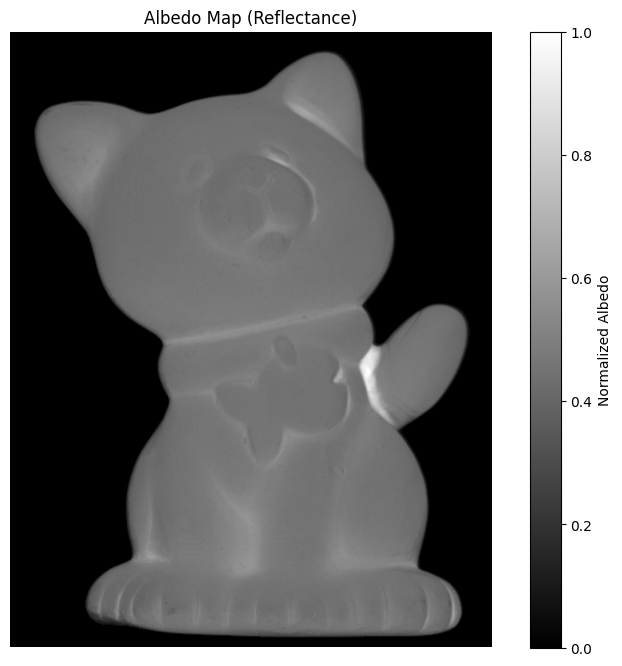

In [10]:
#@title Visualize albedo map

# Normalize albedo for visualization
albedo_normalized = albedo_map.copy()
if albedo_normalized.max() > 0:
    albedo_normalized = albedo_normalized / albedo_normalized.max()

plt.figure(figsize=(10, 8))
plt.imshow(albedo_normalized, cmap='gray')
plt.title('Albedo Map (Reflectance)')
plt.colorbar(label='Normalized Albedo')
plt.axis('off')
plt.show()

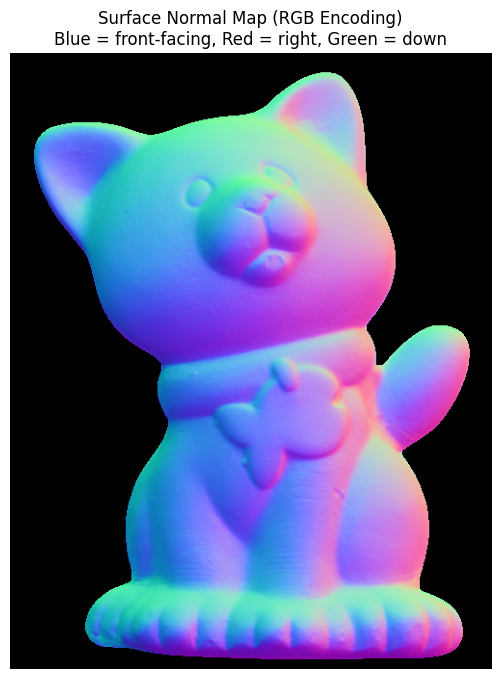

In [11]:
#@title Visualize normal map (RGB encoding)

def visualize_normal_map(normal_map, mask):
    """
    Visualize surface normals using RGB encoding.
    
    Convention:
        R channel: x-component (right is positive)
        G channel: y-component (down is positive)  
        B channel: z-component (towards camera is positive)
    
    Front-facing surfaces (normal pointing at camera) appear blue.
    """
    # Convert normals from [-1, 1] to [0, 1] for RGB visualization
    normal_vis = (normal_map + 1.0) / 2.0
    
    # Apply mask
    normal_vis = normal_vis * mask[:, :, np.newaxis]
    
    return normal_vis

# Visualize normal map
normal_vis = visualize_normal_map(normal_map, mask)

plt.figure(figsize=(10, 8))
plt.imshow(normal_vis)
plt.title('Surface Normal Map (RGB Encoding)\nBlue = front-facing, Red = right, Green = down')
plt.axis('off')
plt.show()

### Step 3: RGB Albedo Recovery

Once we have the surface normals $\mathbf{n}(x)$, we can recover the RGB albedo for each color channel independently.

For each color channel $c \in \{R, G, B\}$ and each pixel $x$:

$$I_c^i(x) = \rho_c(x) \cdot \mathbf{n}(x)^T \mathbf{l}_i$$

where $I_c^i(x)$ is the intensity of channel $c$ in image $i$.

Rearranging for albedo:

$$\rho_c(x) = \frac{\sum_{i=1}^{n} I_c^i(x) \cdot (\mathbf{n}(x)^T \mathbf{l}_i)}{\sum_{i=1}^{n} (\mathbf{n}(x)^T \mathbf{l}_i)^2}$$

This is a weighted least squares solution where the shading term $\mathbf{n}^T \mathbf{l}$ acts as the weight.

Recovering RGB albedo (color map)...
Color map shape: (640, 500, 3)
Color map range: [0.000, 255.000]

DEBUG: RGB Albedo Recovery

Red channel albedo:
  Min: 7.76
  Max: 255.00
  Mean: 196.37
  Std: 28.06

Green channel albedo:
  Min: 7.76
  Max: 255.00
  Mean: 196.37
  Std: 28.06

Blue channel albedo:
  Min: 7.76
  Max: 255.00
  Mean: 196.37
  Std: 28.06

Color reconstruction error:
  Red MAE: 5.09
  Green MAE: 5.09
  Blue MAE: 5.09


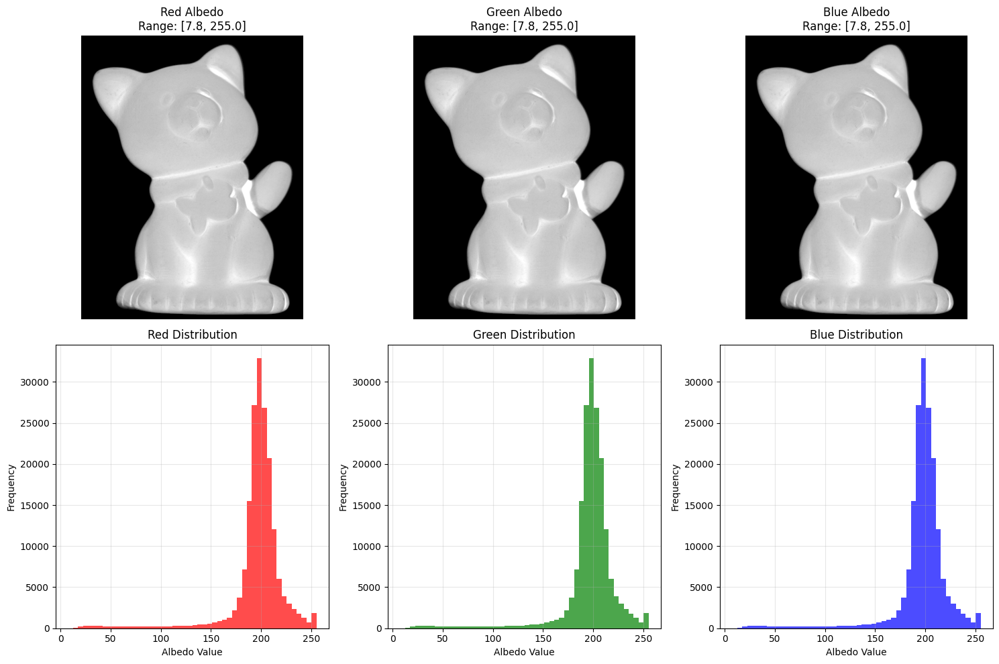

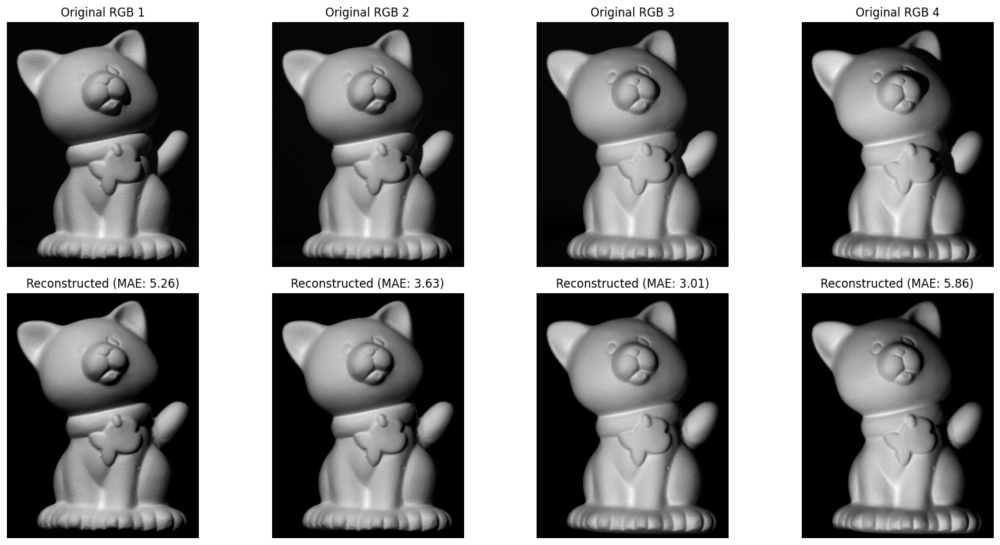

In [12]:
#@title Recover RGB albedo (color map)

def calculate_color_from_normals(images, light_directions, normal_map, mask):
    """
    Recover RGB albedo by solving least squares for each color channel separately.
    
    For each pixel and each channel c:
        I_c = albedo_c * (n^T * L)
    
    Given known normals n, solve for albedo_c.
    
    Args:
        images: RGB image stack (num_images, H, W, 3)
        light_directions: Light direction vectors (num_images, 3)
        normal_map: Estimated surface normals (H, W, 3)
        mask: Binary object mask (H, W)
        
    Returns:
        color_map: Per-pixel RGB albedo (H, W, 3)
    """
    num_images, H, W, C = images.shape
    n_lights = light_directions.shape[0]
    
    # Initialize color map
    color_map = np.zeros((H, W, 3))
    
    # For each color channel
    for c in range(3):
        # Get intensities for this channel: (n_lights, H, W)
        I_c = images[:, :, :, c]
        
        # Reshape to (n_lights, H*W)
        I_c_flat = I_c.reshape(n_lights, H * W)
        
        # Compute shading term: n^T * L for each pixel
        # normal_map: (H, W, 3) -> (H*W, 3)
        # light_directions: (n_lights, 3)
        # shading: (H*W, n_lights)
        normals_flat = normal_map.reshape(H * W, 3)
        shading = normals_flat @ light_directions.T  # (H*W, n_lights)
        shading = shading.T  # (n_lights, H*W)
        
        # Solve for albedo: I_c = albedo_c * shading
        # albedo_c = sum(I_c * shading) / sum(shading^2)
        numerator = np.sum(I_c_flat * shading, axis=0)
        denominator = np.sum(shading * shading, axis=0)
        
        # Avoid division by zero
        albedo_c = np.zeros(H * W)
        valid = denominator > 1e-6
        albedo_c[valid] = numerator[valid] / denominator[valid]
        
        # Reshape and store
        color_map[:, :, c] = albedo_c.reshape(H, W)
    
    # Apply mask and clip to valid range
    color_map = color_map * mask[:, :, np.newaxis]
    color_map = np.clip(color_map, 0, 255)
    
    return color_map

def debug_rgb_albedo(images, color_map, normal_map, L, mask):
    """
    Debug function: Verify RGB albedo recovery.
    """
    print("\n" + "="*60)
    print("DEBUG: RGB Albedo Recovery")
    print("="*60)
    
    # Statistics per channel
    for c, channel_name in enumerate(['Red', 'Green', 'Blue']):
        channel_data = color_map[:, :, c][mask > 0]
        print(f"\n{channel_name} channel albedo:")
        print(f"  Min: {channel_data.min():.2f}")
        print(f"  Max: {channel_data.max():.2f}")
        print(f"  Mean: {channel_data.mean():.2f}")
        print(f"  Std: {channel_data.std():.2f}")
    
    # Check color reconstruction error
    print(f"\nColor reconstruction error:")
    
    # Compute predicted RGB intensities
    I_predicted = np.zeros_like(images, dtype=float)
    
    for i in range(len(L)):
        shading = np.sum(normal_map * L[i], axis=2)  # (H, W)
        for c in range(3):
            I_predicted[i, :, :, c] = color_map[:, :, c] * shading
    
    # Compute error per channel
    for c, channel_name in enumerate(['Red', 'Green', 'Blue']):
        errors = []
        for i in range(len(L)):
            error = np.abs(images[i, :, :, c] - I_predicted[i, :, :, c])[mask > 0]
            errors.append(error.mean())
        
        print(f"  {channel_name} MAE: {np.mean(errors):.2f}")
    
    # Visualize RGB channels separately
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    channel_names = ['Red', 'Green', 'Blue']
    for c in range(3):
        # Albedo channel
        albedo_c = color_map[:, :, c].copy()
        if albedo_c.max() > 0:
            albedo_c_norm = albedo_c / albedo_c.max()
        else:
            albedo_c_norm = albedo_c
        
        axes[0, c].imshow(albedo_c_norm, cmap='gray', vmin=0, vmax=1)
        axes[0, c].set_title(f'{channel_names[c]} Albedo\nRange: [{albedo_c[mask>0].min():.1f}, {albedo_c[mask>0].max():.1f}]')
        axes[0, c].axis('off')
        
        # Histogram
        axes[1, c].hist(albedo_c[mask > 0], bins=50, color=['red', 'green', 'blue'][c], alpha=0.7)
        axes[1, c].set_title(f'{channel_names[c]} Distribution')
        axes[1, c].set_xlabel('Albedo Value')
        axes[1, c].set_ylabel('Frequency')
        axes[1, c].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Compare original vs reconstructed RGB
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    
    for i in range(4):
        # Original
        axes[0, i].imshow(images[i])
        axes[0, i].set_title(f'Original RGB {i+1}')
        axes[0, i].axis('off')
        
        # Reconstructed
        recon = I_predicted[i].copy()
        recon = np.clip(recon, 0, 255).astype(np.uint8)
        axes[1, i].imshow(recon)
        
        # Compute per-image error
        error = np.mean(np.abs(images[i] - I_predicted[i])[mask > 0])
        axes[1, i].set_title(f'Reconstructed (MAE: {error:.2f})')
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print("="*60 + "\n")

# Recover RGB albedo
print("Recovering RGB albedo (color map)...")
color_map = calculate_color_from_normals(images, L, normal_map, mask)

print(f"Color map shape: {color_map.shape}")
print(f"Color map range: [{color_map.min():.3f}, {color_map.max():.3f}]")

# Debug RGB albedo
debug_rgb_albedo(images, color_map, normal_map, L, mask)

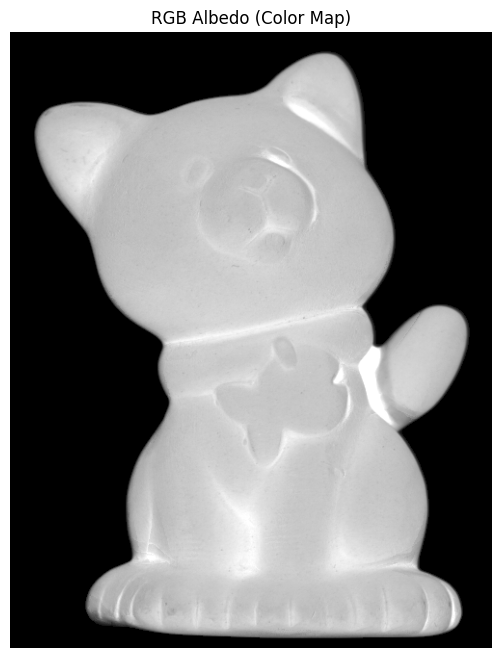

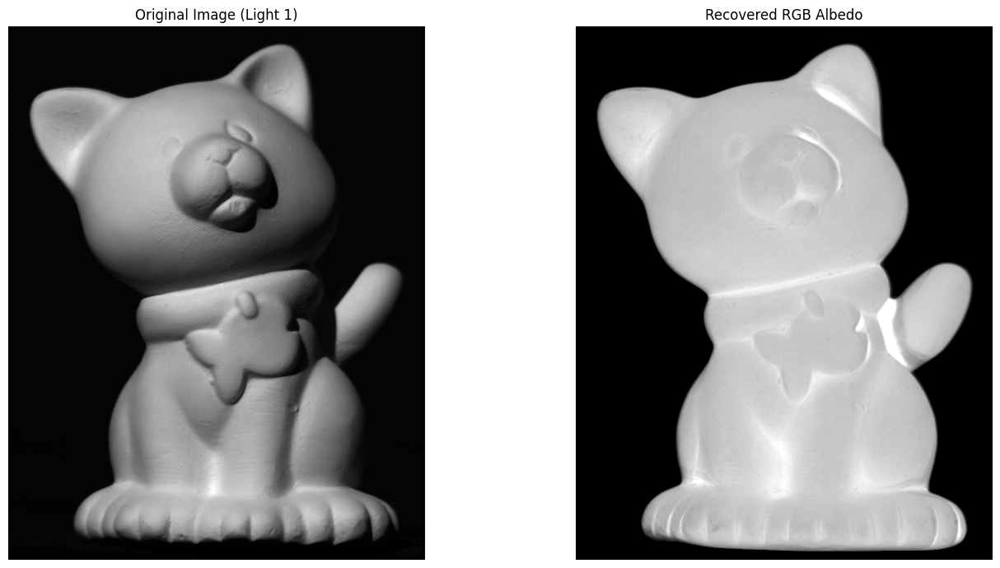

In [13]:
#@title Visualize RGB albedo (color map)

# Normalize color map for visualization
color_map_normalized = color_map.copy()
if color_map_normalized.max() > 0:
    color_map_normalized = color_map_normalized / color_map_normalized.max()

plt.figure(figsize=(10, 8))
plt.imshow(color_map_normalized)
plt.title('RGB Albedo (Color Map)')
plt.axis('off')
plt.show()

# Compare with one of the original images
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

axes[0].imshow(images[0])
axes[0].set_title('Original Image (Light 1)')
axes[0].axis('off')

axes[1].imshow(color_map_normalized)
axes[1].set_title('Recovered RGB Albedo')
axes[1].axis('off')

plt.tight_layout()
plt.show()

In [14]:
#@title Integrate normals to depth using Frankot-Chellappa algorithm

def integrate_normals_to_depth(normal_map, mask):
    """
    Reconstruct depth map by integrating the normal field using Frankot-Chellappa algorithm.
    
    The algorithm enforces integrability by projecting gradient fields onto the space
    of integrable gradients using Fourier transforms.
    
    From unit normal n = (nx, ny, nz), derive surface gradients:
        p = -nx/nz (gradient in x direction)
        q = -ny/nz (gradient in y direction)
    
    Args:
        normal_map: Per-pixel surface normals (H, W, 3)
        mask: Binary object mask (H, W)
        
    Returns:
        depth_map: Estimated depth (H, W)
    """
    H, W, _ = normal_map.shape
    
    # Extract normal components
    nx = normal_map[:, :, 0]
    ny = normal_map[:, :, 1]
    nz = normal_map[:, :, 2]
    
    # Compute gradients p and q
    # Avoid division by zero
    p = np.zeros((H, W))
    q = np.zeros((H, W))
    
    valid = np.abs(nz) > 1e-6
    p[valid] = -nx[valid] / nz[valid]
    q[valid] = -ny[valid] / nz[valid]
    
    # Apply mask
    p = p * mask
    q = q * mask
    
    # Frankot-Chellappa algorithm
    # Create frequency grids
    wx = np.fft.fftfreq(W) * 2 * np.pi
    wy = np.fft.fftfreq(H) * 2 * np.pi
    
    WX, WY = np.meshgrid(wx, wy)
    
    # Fourier transform of gradients
    P = np.fft.fft2(p)
    Q = np.fft.fft2(q)
    
    # Compute depth in Fourier domain
    # Z = (-j*WX*P - j*WY*Q) / (WX^2 + WY^2)
    denominator = WX**2 + WY**2
    denominator[0, 0] = 1  # Avoid division by zero at DC component
    
    Z = (-1j * WX * P - 1j * WY * Q) / denominator
    Z[0, 0] = 0  # Set DC component to zero (arbitrary depth offset)
    
    # Inverse Fourier transform to get depth
    depth_map = np.real(np.fft.ifft2(Z))
    
    # Apply mask and normalize
    depth_map = depth_map * mask
    
    return depth_map

# Integrate normals to depth
print("Integrating normals to depth map...")
depth_map = integrate_normals_to_depth(normal_map, mask)

print(f"Depth map shape: {depth_map.shape}")
print(f"Depth map range: [{depth_map.min():.3f}, {depth_map.max():.3f}]")

Integrating normals to depth map...
Depth map shape: (640, 500)
Depth map range: [-89.435, 103.586]


### Step 4: Surface Integration - From Normals to Depth

Given surface normals $\mathbf{n}(x,y) = (n_x, n_y, n_z)$, we want to recover the depth function $Z(x,y)$.

**Surface Gradients:**

The surface gradients are related to normals by:

$$p(x,y) = \frac{\partial Z}{\partial x} = -\frac{n_x}{n_z}, \quad q(x,y) = \frac{\partial Z}{\partial y} = -\frac{n_y}{n_z}$$

**Integrability Constraint:**

For a valid surface, the mixed partial derivatives must be equal:

$$\frac{\partial p}{\partial y} = \frac{\partial q}{\partial x}$$

**Frankot-Chellappa Algorithm:**

This algorithm enforces integrability in the Fourier domain:

1. Compute Fourier transforms: $P(\omega_x, \omega_y) = \mathcal{F}\{p\}$, $Q(\omega_x, \omega_y) = \mathcal{F}\{q\}$

2. Solve for depth in Fourier domain:

$$Z(\omega_x, \omega_y) = \frac{-j\omega_x P(\omega_x, \omega_y) - j\omega_y Q(\omega_x, \omega_y)}{\omega_x^2 + \omega_y^2}$$

3. Inverse transform: $Z(x,y) = \mathcal{F}^{-1}\{Z(\omega_x, \omega_y)\}$

This projects the gradient field onto the space of integrable gradients.

Integrating normals to depth map...
Depth map shape: (640, 500)
Depth map range: [-89.435, 103.586]

DEBUG: Depth Integration (Frankot-Chellappa)
Surface gradient statistics:
  p (∂Z/∂x):
    Min: -5.841, Max: 3.673
    Mean: -0.079, Std: 1.022
  q (∂Z/∂y):
    Min: -4.442, Max: 3.306
    Mean: -0.223, Std: 0.903

Integrability error (|∂p/∂y - ∂q/∂x|):
  Mean: 0.0630
  Max: 2.6498
  (Lower is better; Frankot-Chellappa minimizes this)

Depth map statistics:
  Min: -89.435
  Max: 103.586
  Mean: 18.221
  Std: 40.402
  Range: 193.021

Gradient reconstruction error:
  p error: Mean=0.4744, Max=51.9979
  q error: Mean=0.5139, Max=53.8440


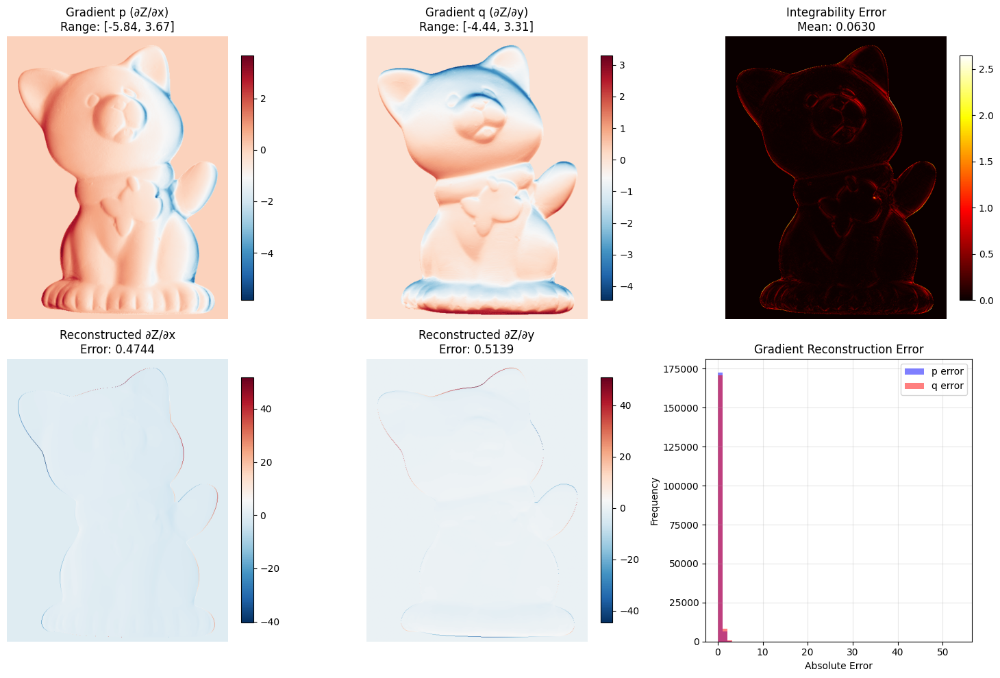

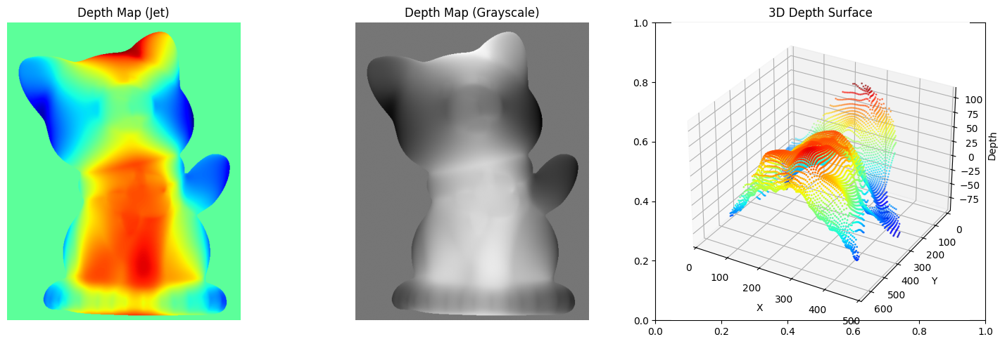

In [15]:
#@title Integrate normals to depth using Frankot-Chellappa algorithm

def integrate_normals_to_depth(normal_map, mask):
    """
    Reconstruct depth map by integrating the normal field using Frankot-Chellappa algorithm.
    
    The algorithm enforces integrability by projecting gradient fields onto the space
    of integrable gradients using Fourier transforms.
    
    From unit normal n = (nx, ny, nz), derive surface gradients:
        p = -nx/nz (gradient in x direction)
        q = -ny/nz (gradient in y direction)
    
    Args:
        normal_map: Per-pixel surface normals (H, W, 3)
        mask: Binary object mask (H, W)
        
    Returns:
        depth_map: Estimated depth (H, W)
    """
    H, W, _ = normal_map.shape
    
    # Extract normal components
    nx = normal_map[:, :, 0]
    ny = normal_map[:, :, 1]
    nz = normal_map[:, :, 2]
    
    # Compute gradients p and q
    # Avoid division by zero
    p = np.zeros((H, W))
    q = np.zeros((H, W))
    
    valid = np.abs(nz) > 1e-6
    p[valid] = -nx[valid] / nz[valid]
    q[valid] = -ny[valid] / nz[valid]
    
    # Apply mask
    p = p * mask
    q = q * mask
    
    # Frankot-Chellappa algorithm
    # Create frequency grids
    wx = np.fft.fftfreq(W) * 2 * np.pi
    wy = np.fft.fftfreq(H) * 2 * np.pi
    
    WX, WY = np.meshgrid(wx, wy)
    
    # Fourier transform of gradients
    P = np.fft.fft2(p)
    Q = np.fft.fft2(q)
    
    # Compute depth in Fourier domain
    # Z = (-j*WX*P - j*WY*Q) / (WX^2 + WY^2)
    denominator = WX**2 + WY**2
    denominator[0, 0] = 1  # Avoid division by zero at DC component
    
    Z = (-1j * WX * P - 1j * WY * Q) / denominator
    Z[0, 0] = 0  # Set DC component to zero (arbitrary depth offset)
    
    # Inverse Fourier transform to get depth
    depth_map = np.real(np.fft.ifft2(Z))
    
    # Apply mask and normalize
    depth_map = depth_map * mask
    
    return depth_map

def debug_depth_integration(normal_map, depth_map, mask):
    """
    Debug function: Verify depth integration and check integrability.
    """
    print("\n" + "="*60)
    print("DEBUG: Depth Integration (Frankot-Chellappa)")
    print("="*60)
    
    H, W, _ = normal_map.shape
    
    # Extract normal components
    nx = normal_map[:, :, 0]
    ny = normal_map[:, :, 1]
    nz = normal_map[:, :, 2]
    
    # Compute gradients
    p = np.zeros((H, W))
    q = np.zeros((H, W))
    valid = np.abs(nz) > 1e-6
    p[valid] = -nx[valid] / nz[valid]
    q[valid] = -ny[valid] / nz[valid]
    
    p_masked = p[mask > 0]
    q_masked = q[mask > 0]
    
    print(f"Surface gradient statistics:")
    print(f"  p (∂Z/∂x):")
    print(f"    Min: {p_masked.min():.3f}, Max: {p_masked.max():.3f}")
    print(f"    Mean: {p_masked.mean():.3f}, Std: {p_masked.std():.3f}")
    print(f"  q (∂Z/∂y):")
    print(f"    Min: {q_masked.min():.3f}, Max: {q_masked.max():.3f}")
    print(f"    Mean: {q_masked.mean():.3f}, Std: {q_masked.std():.3f}")
    
    # Check integrability: ∂p/∂y should equal ∂q/∂x
    dp_dy = np.gradient(p, axis=0)
    dq_dx = np.gradient(q, axis=1)
    
    integrability_error = np.abs(dp_dy - dq_dx)[mask > 0]
    print(f"\nIntegrability error (|∂p/∂y - ∂q/∂x|):")
    print(f"  Mean: {integrability_error.mean():.4f}")
    print(f"  Max: {integrability_error.max():.4f}")
    print(f"  (Lower is better; Frankot-Chellappa minimizes this)")
    
    # Depth statistics
    depth_masked = depth_map[mask > 0]
    print(f"\nDepth map statistics:")
    print(f"  Min: {depth_masked.min():.3f}")
    print(f"  Max: {depth_masked.max():.3f}")
    print(f"  Mean: {depth_masked.mean():.3f}")
    print(f"  Std: {depth_masked.std():.3f}")
    print(f"  Range: {depth_masked.max() - depth_masked.min():.3f}")
    
    # Verify reconstruction: compute gradients from depth and compare
    depth_grad_x = np.gradient(depth_map, axis=1)
    depth_grad_y = np.gradient(depth_map, axis=0)
    
    p_error = np.abs(p - depth_grad_x)[mask > 0]
    q_error = np.abs(q - depth_grad_y)[mask > 0]
    
    print(f"\nGradient reconstruction error:")
    print(f"  p error: Mean={p_error.mean():.4f}, Max={p_error.max():.4f}")
    print(f"  q error: Mean={q_error.mean():.4f}, Max={q_error.max():.4f}")
    
    # Visualize gradients and integrability
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Gradient p
    p_vis = p * mask
    im0 = axes[0, 0].imshow(p_vis, cmap='RdBu_r')
    axes[0, 0].set_title(f'Gradient p (∂Z/∂x)\nRange: [{p_masked.min():.2f}, {p_masked.max():.2f}]')
    axes[0, 0].axis('off')
    plt.colorbar(im0, ax=axes[0, 0], fraction=0.046)
    
    # Gradient q
    q_vis = q * mask
    im1 = axes[0, 1].imshow(q_vis, cmap='RdBu_r')
    axes[0, 1].set_title(f'Gradient q (∂Z/∂y)\nRange: [{q_masked.min():.2f}, {q_masked.max():.2f}]')
    axes[0, 1].axis('off')
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046)
    
    # Integrability error map
    integ_error_map = np.abs(dp_dy - dq_dx) * mask
    im2 = axes[0, 2].imshow(integ_error_map, cmap='hot')
    axes[0, 2].set_title(f'Integrability Error\nMean: {integrability_error.mean():.4f}')
    axes[0, 2].axis('off')
    plt.colorbar(im2, ax=axes[0, 2], fraction=0.046)
    
    # Reconstructed gradients from depth
    depth_grad_x_vis = depth_grad_x * mask
    im3 = axes[1, 0].imshow(depth_grad_x_vis, cmap='RdBu_r')
    axes[1, 0].set_title(f'Reconstructed ∂Z/∂x\nError: {p_error.mean():.4f}')
    axes[1, 0].axis('off')
    plt.colorbar(im3, ax=axes[1, 0], fraction=0.046)
    
    depth_grad_y_vis = depth_grad_y * mask
    im4 = axes[1, 1].imshow(depth_grad_y_vis, cmap='RdBu_r')
    axes[1, 1].set_title(f'Reconstructed ∂Z/∂y\nError: {q_error.mean():.4f}')
    axes[1, 1].axis('off')
    plt.colorbar(im4, ax=axes[1, 1], fraction=0.046)
    
    # Gradient error map
    gradient_error = (p_error.mean() + q_error.mean()) / 2
    axes[1, 2].hist(p_error, bins=50, alpha=0.5, label='p error', color='blue')
    axes[1, 2].hist(q_error, bins=50, alpha=0.5, label='q error', color='red')
    axes[1, 2].set_xlabel('Absolute Error')
    axes[1, 2].set_ylabel('Frequency')
    axes[1, 2].set_title('Gradient Reconstruction Error')
    axes[1, 2].legend()
    axes[1, 2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Visualize depth from different angles
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    depth_vis = depth_map.copy()
    depth_vis = depth_vis - depth_vis[mask > 0].min()
    if depth_vis.max() > 0:
        depth_vis = depth_vis / depth_vis.max()
    
    axes[0].imshow(depth_vis, cmap='jet')
    axes[0].set_title('Depth Map (Jet)')
    axes[0].axis('off')
    
    axes[1].imshow(depth_vis, cmap='gray')
    axes[1].set_title('Depth Map (Grayscale)')
    axes[1].axis('off')
    
    # 3D surface plot
    from mpl_toolkits.mplot3d import Axes3D
    ax = fig.add_subplot(133, projection='3d')
    
    # Subsample for visualization
    subsample = 5
    X, Y = np.meshgrid(range(0, W, subsample), range(0, H, subsample))
    Z = depth_map[::subsample, ::subsample]
    mask_sub = mask[::subsample, ::subsample]
    
    X_masked = X[mask_sub > 0]
    Y_masked = Y[mask_sub > 0]
    Z_masked = Z[mask_sub > 0]
    
    ax.scatter(X_masked, Y_masked, Z_masked, c=Z_masked, cmap='jet', s=1)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Depth')
    ax.set_title('3D Depth Surface')
    ax.invert_yaxis()
    
    plt.tight_layout()
    plt.show()
    
    print("="*60 + "\n")

# Integrate normals to depth
print("Integrating normals to depth map...")
depth_map = integrate_normals_to_depth(normal_map, mask)

print(f"Depth map shape: {depth_map.shape}")
print(f"Depth map range: [{depth_map.min():.3f}, {depth_map.max():.3f}]")

# Debug depth integration
debug_depth_integration(normal_map, depth_map, mask)

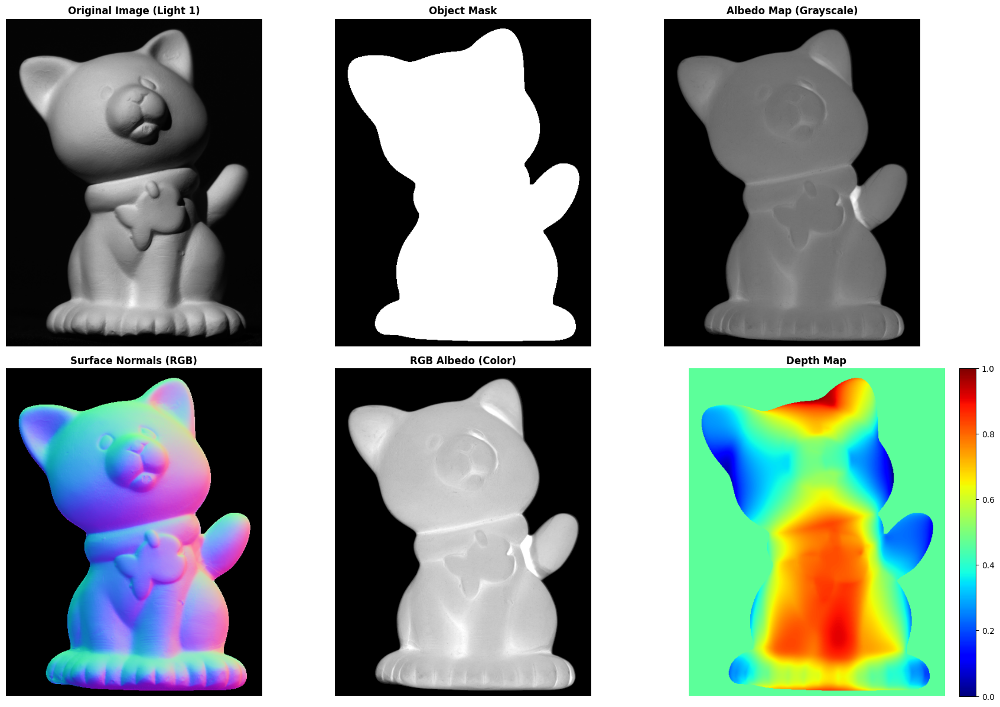


PHOTOMETRIC STEREO RECONSTRUCTION COMPLETE
✓ Loaded 20 images
✓ Estimated surface normals at 180700 pixels
✓ Recovered albedo (grayscale and RGB)
✓ Integrated normals to depth map


In [16]:
#@title Summary visualization: All results together

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Original image
axes[0, 0].imshow(images[0])
axes[0, 0].set_title('Original Image (Light 1)', fontsize=12, fontweight='bold')
axes[0, 0].axis('off')

# Mask
axes[0, 1].imshow(mask, cmap='gray')
axes[0, 1].set_title('Object Mask', fontsize=12, fontweight='bold')
axes[0, 1].axis('off')

# Albedo (grayscale)
albedo_vis = albedo_map.copy()
if albedo_vis.max() > 0:
    albedo_vis = albedo_vis / albedo_vis.max()
axes[0, 2].imshow(albedo_vis, cmap='gray')
axes[0, 2].set_title('Albedo Map (Grayscale)', fontsize=12, fontweight='bold')
axes[0, 2].axis('off')

# Normal map
normal_vis = (normal_map + 1.0) / 2.0 * mask[:, :, np.newaxis]
axes[1, 0].imshow(normal_vis)
axes[1, 0].set_title('Surface Normals (RGB)', fontsize=12, fontweight='bold')
axes[1, 0].axis('off')

# Color map (RGB albedo)
color_vis = color_map.copy()
if color_vis.max() > 0:
    color_vis = color_vis / color_vis.max()
axes[1, 1].imshow(color_vis)
axes[1, 1].set_title('RGB Albedo (Color)', fontsize=12, fontweight='bold')
axes[1, 1].axis('off')

# Depth map
depth_vis = depth_map.copy()
depth_vis = depth_vis - depth_vis[mask > 0].min()
if depth_vis.max() > 0:
    depth_vis = depth_vis / depth_vis.max()
im = axes[1, 2].imshow(depth_vis, cmap='jet')
axes[1, 2].set_title('Depth Map', fontsize=12, fontweight='bold')
axes[1, 2].axis('off')
plt.colorbar(im, ax=axes[1, 2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("PHOTOMETRIC STEREO RECONSTRUCTION COMPLETE")
print("="*60)
print(f"✓ Loaded {len(images)} images")
print(f"✓ Estimated surface normals at {np.sum(mask)} pixels")
print(f"✓ Recovered albedo (grayscale and RGB)")
print(f"✓ Integrated normals to depth map")
print("="*60)

---
## Additional Debugging: Light Direction Analysis

Understanding the light source configuration is crucial for photometric stereo. Let's analyze the distribution and quality of our lighting setup.

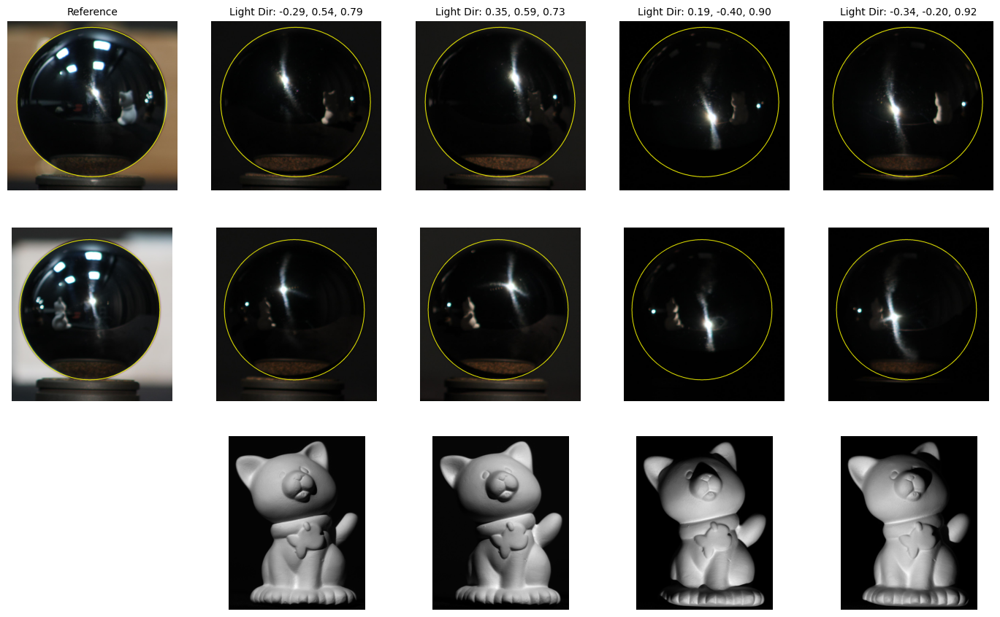

In [17]:
#@title Display some selected images with their light directions

import cv2
import matplotlib.pyplot as plt
import os
import numpy as np

# Define frame numbers to be displayed
frame_numbers = [1, 16, 15, 5] # Reverted to original frame_numbers as per previous conversation history

# Calculate total number of columns: 1 for ref image + len(frame_numbers)
num_columns = len(frame_numbers) + 1

# Create a 3x(num_columns) subplot grid
fig, axes = plt.subplots(3, num_columns, figsize=(15, 9))

# --- Read circle data for both light probes ---
# LightProbe-1
circle_data_probe1 = np.loadtxt(os.path.join(base_data_filepath, 'LightProbe-1/circle_data.txt'))
cx1, cy1_bl, r1 = int(circle_data_probe1[0]), int(circle_data_probe1[1]), int(circle_data_probe1[2])

# LightProbe-2
circle_data_probe2 = np.loadtxt(os.path.join(base_data_filepath, 'LightProbe-2/circle_data.txt'))
cx2, cy2_bl, r2 = int(circle_data_probe2[0]), int(circle_data_probe2[1]), int(circle_data_probe2[2])

# --- Plot the Reference Column (index 0) ---
ref_column_idx = 0

# Load and plot LightProbe-1 reference image
img_path_probe1_ref = os.path.join(base_data_filepath, 'LightProbe-1/ref.JPG')
img_probe1_ref = cv2.imread(img_path_probe1_ref)
img_probe1_ref_rgb = cv2.cvtColor(img_probe1_ref, cv2.COLOR_BGR2RGB)

# Load and plot LightProbe-2 reference image
img_path_probe2_ref = os.path.join(base_data_filepath, 'LightProbe-2/ref.JPG')
img_probe2_ref = cv2.imread(img_path_probe2_ref)
img_probe2_ref_rgb = cv2.cvtColor(img_probe2_ref, cv2.COLOR_BGR2RGB)

# Transform circle coordinates from a bottom-left coordinate system that is
# 1-indexed (as used in the data file) to a top-left coordinate system that
# is 0-indexed (as used by matplotlib)
img_probe1_height = img_probe1_ref.shape[0]
cy1 = img_probe1_height - cy1_bl
cx1 = cx1-1

img_probe2_height = img_probe2_ref.shape[0]
cy2 = img_probe2_height - cy2_bl
cx2 = cx2-1

# Superimpose circle on LightProbe-1 reference image
cv2.circle(img_probe1_ref_rgb, (cx1, cy1), r1, (255, 255, 0), 4) # Yellow circle, thickness 4
axes[0, ref_column_idx].imshow(img_probe1_ref_rgb)
axes[0, ref_column_idx].axis('off')
axes[0, ref_column_idx].set_ylabel('LightProbe-1', rotation=90, size=10)
axes[0, ref_column_idx].set_title('Reference', fontsize=10)

# Superimpose circle on LightProbe-2 reference image
cv2.circle(img_probe2_ref_rgb, (cx2, cy2), r2, (255, 255, 0), 4) # Yellow circle, thickness 4
axes[1, ref_column_idx].imshow(img_probe2_ref_rgb)
axes[1, ref_column_idx].axis('off')
axes[1, ref_column_idx].set_ylabel('LightProbe-2', rotation=90, size=10)

# For Object row in reference column, hide axes
axes[2, ref_column_idx].axis('off')
axes[2, ref_column_idx].set_ylabel('Object', rotation=90, size=10)

# --- Iterate through frame numbers and plot images  ---
for i, NN in enumerate(frame_numbers):
    current_column_idx = i + 1 # Offset by 1 for the new reference column

    # Load images for LightProbe-1, LightProbe-2, and Object
    img_path_probe1 = os.path.join(base_data_filepath, f'LightProbe-1/Image_{NN:02d}.JPG')
    img_path_probe2 = os.path.join(base_data_filepath, f'LightProbe-2/Image_{NN:02d}.JPG')
    img_path_object = os.path.join(base_data_filepath, f'Object/Image_{NN:02d}.png')

    img_probe1 = cv2.imread(img_path_probe1)
    img_probe2 = cv2.imread(img_path_probe2)
    img_object = cv2.imread(img_path_object)

    # Convert BGR to RGB for matplotlib
    img_probe1_rgb = cv2.cvtColor(img_probe1, cv2.COLOR_BGR2RGB)
    img_probe2_rgb = cv2.cvtColor(img_probe2, cv2.COLOR_BGR2RGB)
    img_object_rgb = cv2.cvtColor(img_object, cv2.COLOR_BGR2RGB)

    # Superimpose circle on LightProbe-1 dynamic image
    cv2.circle(img_probe1_rgb, (cx1, cy1), r1, (255, 255, 0), 4) # Yellow circle, thickness 4
    # Plot LightProbe-1 image in the first row
    axes[0, current_column_idx].imshow(img_probe1_rgb)
    axes[0, current_column_idx].axis('off')

    # Superimpose circle on LightProbe-2 dynamic image
    cv2.circle(img_probe2_rgb, (cx2, cy2), r2, (255, 255, 0), 4) # Yellow circle, thickness 4
    # Plot LightProbe-2 image in the second row
    axes[1, current_column_idx].imshow(img_probe2_rgb)
    axes[1, current_column_idx].axis('off')

    # Plot Object image in the third row
    axes[2, current_column_idx].imshow(img_object_rgb)
    axes[2, current_column_idx].axis('off')

    # Get light direction from L (L has shape (3, 20))
    # NN-th image corresponds to the (NN-1)-th row in L (0-indexed).
    light_direction = L[NN-1, :]
    axes[0, current_column_idx].set_title(f'Light Dir: {light_direction[0]:.2f}, {light_direction[1]:.2f}, {light_direction[2]:.2f}', fontsize=10)

# Adjust subplot parameters to give more room for y-labels
fig.subplots_adjust(left=0.08, right=0.98, top=0.92, bottom=0.02)
plt.show()

---
## Interactive 3D Visualization

Now let's create an interactive 3D model from our photometric stereo results. We'll convert the depth map to a 3D point cloud and color it using the recovered albedo.

In [18]:
#@title Create 3D point cloud from depth map

import plotly.graph_objects as go
from plotly.subplots import make_subplots

def depth_to_point_cloud(depth_map, mask, subsample=1):
    """
    Convert depth map to 3D point cloud.
    
    Args:
        depth_map: (H, W) depth values
        mask: (H, W) binary mask
        subsample: Subsampling factor (1 = all points, 2 = every other point, etc.)
        
    Returns:
        points_3d: (N, 3) array of 3D coordinates [x, y, z]
        pixel_coords: (N, 2) array of original pixel coordinates [row, col]
    """
    H, W = depth_map.shape
    
    # Create pixel coordinate grids
    y_coords, x_coords = np.meshgrid(range(H), range(W), indexing='ij')
    
    # Subsample
    y_coords = y_coords[::subsample, ::subsample]
    x_coords = x_coords[::subsample, ::subsample]
    depth_sub = depth_map[::subsample, ::subsample]
    mask_sub = mask[::subsample, ::subsample]
    
    # Flatten and filter by mask
    valid = mask_sub > 0
    x_flat = x_coords[valid]
    y_flat = y_coords[valid]
    z_flat = depth_sub[valid]
    
    # Stack into (N, 3) array
    # Note: We use -z to flip depth so that closer objects have higher z
    points_3d = np.stack([x_flat, y_flat, -z_flat], axis=1)
    pixel_coords = np.stack([y_flat, x_flat], axis=1)
    
    return points_3d, pixel_coords

def plot_point_cloud_with_albedo(points_3d, pixel_coords, color_map, 
                                  color_by='rgb', colorscale='Viridis',
                                  point_size=2, title='3D Point Cloud', 
                                  camera_eye=None, show_axes=True):
    """
    Plot 3D point cloud with color based on albedo.
    
    Args:
        points_3d: (N, 3) array of 3D points [x, y, z]
        pixel_coords: (N, 2) array of pixel coordinates [row, col] for color lookup
        color_map: (H, W, 3) RGB albedo map OR (H, W) grayscale albedo
        color_by: 'rgb' (use RGB albedo), 'grayscale' (use grayscale albedo), 
                  'x', 'y', 'z', 'distance'
        colorscale: Plotly colorscale (only used for non-RGB coloring)
        point_size: Size of points
        title: Plot title
        camera_eye: Camera position dict, e.g., dict(x=1.5, y=1.5, z=1.5)
        show_axes: Whether to show axis labels
        
    Returns:
        Plotly figure object
    """
    if len(points_3d) == 0:
        print("No points to plot!")
        return None
    
    # Extract coordinates
    x = points_3d[:, 0]
    y = points_3d[:, 1]
    z = points_3d[:, 2]
    
    # Determine colors
    if color_by == 'rgb':
        # Extract RGB colors from color_map
        rows = pixel_coords[:, 0].astype(int)
        cols = pixel_coords[:, 1].astype(int)
        
        if len(color_map.shape) == 3:
            # RGB color map
            colors_rgb = color_map[rows, cols, :]  # (N, 3)
            
            # Normalize to [0, 1] for Plotly
            colors_rgb = colors_rgb / 255.0 if colors_rgb.max() > 1 else colors_rgb
            colors_rgb = np.clip(colors_rgb, 0, 1)
            
            # Convert to RGB strings
            marker_colors = [f'rgb({int(r*255)},{int(g*255)},{int(b*255)})' 
                           for r, g, b in colors_rgb]
            
            # Create scatter plot with RGB colors
            fig = go.Figure(data=[go.Scatter3d(
                x=x, y=y, z=z,
                mode='markers',
                marker=dict(
                    size=point_size,
                    color=marker_colors,
                ),
                text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}<br>RGB: ({int(colors_rgb[i,0]*255)}, {int(colors_rgb[i,1]*255)}, {int(colors_rgb[i,2]*255)})'
                      for i in range(len(x))],
                hoverinfo='text'
            )])
            
        else:
            # Grayscale color map
            color_values = color_map[rows, cols]
            
            fig = go.Figure(data=[go.Scatter3d(
                x=x, y=y, z=z,
                mode='markers',
                marker=dict(
                    size=point_size,
                    color=color_values,
                    colorscale=colorscale,
                    colorbar=dict(title='Albedo'),
                    showscale=True,
                ),
                text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}<br>Albedo: {color_values[i]:.1f}'
                      for i in range(len(x))],
                hoverinfo='text'
            )])
            
    elif color_by == 'grayscale':
        # Use grayscale albedo even if RGB is available
        rows = pixel_coords[:, 0].astype(int)
        cols = pixel_coords[:, 1].astype(int)
        
        if len(color_map.shape) == 3:
            color_values = np.mean(color_map[rows, cols, :], axis=1)
        else:
            color_values = color_map[rows, cols]
        
        fig = go.Figure(data=[go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=point_size,
                color=color_values,
                colorscale=colorscale,
                colorbar=dict(title='Albedo (Grayscale)'),
                showscale=True,
            ),
            text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}<br>Albedo: {color_values[i]:.1f}'
                  for i in range(len(x))],
            hoverinfo='text'
        )])
        
    elif color_by == 'x':
        color_values = x
        colorbar_title = 'X Position'
        fig = go.Figure(data=[go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=point_size,
                color=color_values,
                colorscale=colorscale,
                colorbar=dict(title=colorbar_title),
                showscale=True,
            ),
            text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}'
                  for i in range(len(x))],
            hoverinfo='text'
        )])
        
    elif color_by == 'y':
        color_values = y
        colorbar_title = 'Y Position'
        fig = go.Figure(data=[go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=point_size,
                color=color_values,
                colorscale=colorscale,
                colorbar=dict(title=colorbar_title),
                showscale=True,
            ),
            text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}'
                  for i in range(len(x))],
            hoverinfo='text'
        )])
        
    elif color_by == 'z':
        color_values = z
        colorbar_title = 'Z Position (Depth)'
        fig = go.Figure(data=[go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=point_size,
                color=color_values,
                colorscale=colorscale,
                colorbar=dict(title=colorbar_title),
                showscale=True,
            ),
            text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}'
                  for i in range(len(x))],
            hoverinfo='text'
        )])
        
    elif color_by == 'distance':
        color_values = np.sqrt(x**2 + y**2 + z**2)
        colorbar_title = 'Distance from Origin'
        fig = go.Figure(data=[go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=point_size,
                color=color_values,
                colorscale=colorscale,
                colorbar=dict(title=colorbar_title),
                showscale=True,
            ),
            text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}<br>Dist: {color_values[i]:.1f}'
                  for i in range(len(x))],
            hoverinfo='text'
        )])
    
    # Update layout
    scene_dict = dict(
        xaxis_title='X (pixels)' if show_axes else '',
        yaxis_title='Y (pixels)' if show_axes else '',
        zaxis_title='Z (depth)' if show_axes else '',
        aspectmode='data',
        camera=dict(
            eye=camera_eye if camera_eye is not None else dict(x=1.5, y=1.5, z=1.5)
        )
    )
    
    if not show_axes:
        scene_dict['xaxis'] = dict(showticklabels=False, title='')
        scene_dict['yaxis'] = dict(showticklabels=False, title='')
        scene_dict['zaxis'] = dict(showticklabels=False, title='')
    
    fig.update_layout(
        title=title,
        scene=scene_dict,
        width=900,
        height=700,
    )
    
    return fig

# Convert depth map to point cloud
print("Converting depth map to 3D point cloud...")
subsample_factor = 2  # Subsample to reduce number of points (1 = all points, 2 = every other point)
points_3d, pixel_coords = depth_to_point_cloud(depth_map, mask, subsample=subsample_factor)

print(f"Generated {len(points_3d)} 3D points")
print(f"Point cloud bounds:")
print(f"  X: [{points_3d[:, 0].min():.1f}, {points_3d[:, 0].max():.1f}]")
print(f"  Y: [{points_3d[:, 1].min():.1f}, {points_3d[:, 1].max():.1f}]")
print(f"  Z: [{points_3d[:, 2].min():.1f}, {points_3d[:, 2].max():.1f}]")

Converting depth map to 3D point cloud...
Generated 45165 3D points
Point cloud bounds:
  X: [26.0, 476.0]
  Y: [20.0, 628.0]
  Z: [-103.3, 88.8]


In [19]:
"""
Interactive 3D Visualization for Photometric Stereo Results

This module provides functions to create interactive 3D point clouds
from photometric stereo depth maps, colored by albedo.
"""

import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots


def depth_to_point_cloud(depth_map, mask, subsample=1):
    """
    Convert depth map to 3D point cloud.
    
    Args:
        depth_map: (H, W) depth values
        mask: (H, W) binary mask
        subsample: Subsampling factor (1 = all points, 2 = every other point, etc.)
        
    Returns:
        points_3d: (N, 3) array of 3D coordinates [x, y, z]
        pixel_coords: (N, 2) array of original pixel coordinates [row, col]
    """
    H, W = depth_map.shape
    
    # Create pixel coordinate grids
    y_coords, x_coords = np.meshgrid(range(H), range(W), indexing='ij')
    
    # Subsample
    y_coords = y_coords[::subsample, ::subsample]
    x_coords = x_coords[::subsample, ::subsample]
    depth_sub = depth_map[::subsample, ::subsample]
    mask_sub = mask[::subsample, ::subsample]
    
    # Flatten and filter by mask
    valid = mask_sub > 0
    x_flat = x_coords[valid]
    y_flat = y_coords[valid]
    z_flat = depth_sub[valid]
    
    # Stack into (N, 3) array
    # Note: We use -z to flip depth so that closer objects have higher z
    points_3d = np.stack([x_flat, y_flat, -z_flat], axis=1)
    pixel_coords = np.stack([y_flat, x_flat], axis=1)
    
    return points_3d, pixel_coords


def plot_point_cloud_with_albedo(points_3d, pixel_coords, color_map, 
                                  color_by='rgb', colorscale='Viridis',
                                  point_size=2, title='3D Point Cloud', 
                                  camera_eye=None, show_axes=True):
    """
    Plot 3D point cloud with color based on albedo.
    
    Args:
        points_3d: (N, 3) array of 3D points [x, y, z]
        pixel_coords: (N, 2) array of pixel coordinates [row, col] for color lookup
        color_map: (H, W, 3) RGB albedo map OR (H, W) grayscale albedo
        color_by: 'rgb' (use RGB albedo), 'grayscale' (use grayscale albedo), 
                  'x', 'y', 'z', 'distance'
        colorscale: Plotly colorscale (only used for non-RGB coloring)
        point_size: Size of points
        title: Plot title
        camera_eye: Camera position dict, e.g., dict(x=1.5, y=1.5, z=1.5)
        show_axes: Whether to show axis labels
        
    Returns:
        Plotly figure object
    """
    if len(points_3d) == 0:
        print("No points to plot!")
        return None
    
    # Extract coordinates
    x = points_3d[:, 0]
    y = points_3d[:, 1]
    z = points_3d[:, 2]
    
    # Determine colors
    if color_by == 'rgb':
        # Extract RGB colors from color_map
        rows = pixel_coords[:, 0].astype(int)
        cols = pixel_coords[:, 1].astype(int)
        
        if len(color_map.shape) == 3:
            # RGB color map
            colors_rgb = color_map[rows, cols, :]  # (N, 3)
            
            # Normalize to [0, 1] for Plotly
            colors_rgb = colors_rgb / 255.0 if colors_rgb.max() > 1 else colors_rgb
            colors_rgb = np.clip(colors_rgb, 0, 1)
            
            # Convert to RGB strings
            marker_colors = [f'rgb({int(r*255)},{int(g*255)},{int(b*255)})' 
                           for r, g, b in colors_rgb]
            
            # Create scatter plot with RGB colors
            fig = go.Figure(data=[go.Scatter3d(
                x=x, y=y, z=z,
                mode='markers',
                marker=dict(
                    size=point_size,
                    color=marker_colors,
                ),
                text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}<br>RGB: ({int(colors_rgb[i,0]*255)}, {int(colors_rgb[i,1]*255)}, {int(colors_rgb[i,2]*255)})'
                      for i in range(len(x))],
                hoverinfo='text'
            )])
            
        else:
            # Grayscale color map
            color_values = color_map[rows, cols]
            
            fig = go.Figure(data=[go.Scatter3d(
                x=x, y=y, z=z,
                mode='markers',
                marker=dict(
                    size=point_size,
                    color=color_values,
                    colorscale=colorscale,
                    colorbar=dict(title='Albedo'),
                    showscale=True,
                ),
                text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}<br>Albedo: {color_values[i]:.1f}'
                      for i in range(len(x))],
                hoverinfo='text'
            )])
            
    elif color_by == 'grayscale':
        # Use grayscale albedo even if RGB is available
        rows = pixel_coords[:, 0].astype(int)
        cols = pixel_coords[:, 1].astype(int)
        
        if len(color_map.shape) == 3:
            color_values = np.mean(color_map[rows, cols, :], axis=1)
        else:
            color_values = color_map[rows, cols]
        
        fig = go.Figure(data=[go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=point_size,
                color=color_values,
                colorscale=colorscale,
                colorbar=dict(title='Albedo (Grayscale)'),
                showscale=True,
            ),
            text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}<br>Albedo: {color_values[i]:.1f}'
                  for i in range(len(x))],
            hoverinfo='text'
        )])
        
    elif color_by == 'x':
        color_values = x
        colorbar_title = 'X Position'
        fig = go.Figure(data=[go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=point_size,
                color=color_values,
                colorscale=colorscale,
                colorbar=dict(title=colorbar_title),
                showscale=True,
            ),
            text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}'
                  for i in range(len(x))],
            hoverinfo='text'
        )])
        
    elif color_by == 'y':
        color_values = y
        colorbar_title = 'Y Position'
        fig = go.Figure(data=[go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=point_size,
                color=color_values,
                colorscale=colorscale,
                colorbar=dict(title=colorbar_title),
                showscale=True,
            ),
            text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}'
                  for i in range(len(x))],
            hoverinfo='text'
        )])
        
    elif color_by == 'z':
        color_values = z
        colorbar_title = 'Z Position (Depth)'
        fig = go.Figure(data=[go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=point_size,
                color=color_values,
                colorscale=colorscale,
                colorbar=dict(title=colorbar_title),
                showscale=True,
            ),
            text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}'
                  for i in range(len(x))],
            hoverinfo='text'
        )])
        
    elif color_by == 'distance':
        color_values = np.sqrt(x**2 + y**2 + z**2)
        colorbar_title = 'Distance from Origin'
        fig = go.Figure(data=[go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=point_size,
                color=color_values,
                colorscale=colorscale,
                colorbar=dict(title=colorbar_title),
                showscale=True,
            ),
            text=[f'X: {x[i]:.1f}<br>Y: {y[i]:.1f}<br>Z: {z[i]:.1f}<br>Dist: {color_values[i]:.1f}'
                  for i in range(len(x))],
            hoverinfo='text'
        )])
    
    # Update layout
    scene_dict = dict(
        xaxis_title='X (pixels)' if show_axes else '',
        yaxis_title='Y (pixels)' if show_axes else '',
        zaxis_title='Z (depth)' if show_axes else '',
        aspectmode='data',
        camera=dict(
            eye=camera_eye if camera_eye is not None else dict(x=1.5, y=1.5, z=1.5)
        )
    )
    
    if not show_axes:
        scene_dict['xaxis'] = dict(showticklabels=False, title='')
        scene_dict['yaxis'] = dict(showticklabels=False, title='')
        scene_dict['zaxis'] = dict(showticklabels=False, title='')
    
    fig.update_layout(
        title=title,
        scene=scene_dict,
        width=900,
        height=700,
    )
    
    return fig


def create_multiple_views(points_3d, pixel_coords, color_map, point_size=2):
    """
    Create a figure with multiple views of the 3D point cloud.
    
    Args:
        points_3d: (N, 3) array of 3D points
        pixel_coords: (N, 2) array of pixel coordinates
        color_map: (H, W, 3) RGB albedo map
        point_size: Size of points
        
    Returns:
        Plotly figure with subplots
    """
    from plotly.subplots import make_subplots
    
    # Extract coordinates
    x = points_3d[:, 0]
    y = points_3d[:, 1]
    z = points_3d[:, 2]
    
    # Extract RGB colors
    rows = pixel_coords[:, 0].astype(int)
    cols = pixel_coords[:, 1].astype(int)
    colors_rgb = color_map[rows, cols, :]
    colors_rgb = colors_rgb / 255.0 if colors_rgb.max() > 1 else colors_rgb
    colors_rgb = np.clip(colors_rgb, 0, 1)
    marker_colors = [f'rgb({int(r*255)},{int(g*255)},{int(b*255)})' 
                   for r, g, b in colors_rgb]
    
    # Create subplots
    fig = make_subplots(
        rows=2, cols=2,
        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}],
               [{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
        subplot_titles=('Front View', 'Side View', 'Top View', 'Perspective View')
    )
    
    # Different camera angles
    cameras = [
        dict(x=0, y=0, z=2),      # Front
        dict(x=2, y=0, z=0),      # Side
        dict(x=0, y=2, z=0),      # Top
        dict(x=1.5, y=1.5, z=1.5) # Perspective
    ]
    
    positions = [(1, 1), (1, 2), (2, 1), (2, 2)]
    
    for idx, (row, col) in enumerate(positions):
        fig.add_trace(
            go.Scatter3d(
                x=x, y=y, z=z,
                mode='markers',
                marker=dict(size=point_size, color=marker_colors),
                showlegend=False,
                hoverinfo='skip'
            ),
            row=row, col=col
        )
        
        # Update camera for this subplot
        scene_name = 'scene' if idx == 0 else f'scene{idx+1}'
        fig.update_layout({
            scene_name: dict(
                camera=dict(eye=cameras[idx]),
                aspectmode='data',
                xaxis_title='X',
                yaxis_title='Y',
                zaxis_title='Z'
            )
        })
    
    fig.update_layout(
        title='3D Point Cloud - Multiple Views',
        width=1400,
        height=1000,
    )
    
    return fig


def export_point_cloud(points_3d, pixel_coords, color_map, filename='point_cloud.ply'):
    """
    Export point cloud to PLY format for use in other 3D software.
    
    Args:
        points_3d: (N, 3) array of 3D points
        pixel_coords: (N, 2) array of pixel coordinates
        color_map: (H, W, 3) RGB albedo map
        filename: Output filename
    """
    # Extract RGB colors
    rows = pixel_coords[:, 0].astype(int)
    cols = pixel_coords[:, 1].astype(int)
    colors_rgb = color_map[rows, cols, :]
    colors_rgb = np.clip(colors_rgb, 0, 255).astype(np.uint8)
    
    # Write PLY file
    with open(filename, 'w') as f:
        # Header
        f.write("ply\n")
        f.write("format ascii 1.0\n")
        f.write(f"element vertex {len(points_3d)}\n")
        f.write("property float x\n")
        f.write("property float y\n")
        f.write("property float z\n")
        f.write("property uchar red\n")
        f.write("property uchar green\n")
        f.write("property uchar blue\n")
        f.write("end_header\n")
        
        # Data
        for i in range(len(points_3d)):
            x, y, z = points_3d[i]
            r, g, b = colors_rgb[i]
            f.write(f"{x} {y} {z} {r} {g} {b}\n")
    
    print(f"Exported {len(points_3d)} points to {filename}")


if __name__ == "__main__":
    print("Interactive 3D Visualization Module")
    print("Import this module in your notebook to use the visualization functions.")


Interactive 3D Visualization Module
Import this module in your notebook to use the visualization functions.


In [20]:
# Convert depth map to point cloud
# Subsample factor: 1 = all points, 2 = every other point, etc.
# Use higher values for faster rendering with large images
subsample_factor = 2

points_3d, pixel_coords = depth_to_point_cloud(depth_map, mask, subsample=subsample_factor)

print(f"Generated {len(points_3d):,} 3D points")
print(f"\nPoint cloud bounds:")
print(f"  X: [{points_3d[:, 0].min():.1f}, {points_3d[:, 0].max():.1f}]")
print(f"  Y: [{points_3d[:, 1].min():.1f}, {points_3d[:, 1].max():.1f}]")
print(f"  Z: [{points_3d[:, 2].min():.1f}, {points_3d[:, 2].max():.1f}]")

Generated 45,165 3D points

Point cloud bounds:
  X: [26.0, 476.0]
  Y: [20.0, 628.0]
  Z: [-103.3, 88.8]


In [ ]:
# Color by grayscale albedo
fig_gray = plot_point_cloud_with_albedo(
    points_3d=points_3d,
    pixel_coords=pixel_coords,
    color_map=color_map,
    color_by='grayscale',
    colorscale='Greys',
    point_size=3,
    title='3D Reconstruction - Grayscale Albedo',
    camera_eye=dict(x=1.5, y=1.5, z=1.5)
)

fig_gray.show()